<a href="https://colab.research.google.com/github/mmorari-cmyk/CURSO_SE.ALES_Y_SISTEMAS/blob/main/Taller2/Taller_base_para_el_proyecto_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

BASE PARA EL PROYECTO FINAL-TRANSFORMADA Z


1. Descargue 10 segundos de la canción de su preferencia desde youtube, y generé un filtro pasabanda (el usuario debe poder definir las frecuencias de corte) para cada uno de los filtros descritos (el usuario también debe poder fijar los parámetros de diseño de cada filtro). Compare los resultados de los filtros estudiados en este cuaderno tipo IIR para diseño Butterworth, Chebyshev 1, Chebyshev 2, Bessel y Elíptico.

In [ ]:
#! pip install youtube-dl
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

     / 2.9 MB 9.8 MB/s 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for yt-dlp: filename=yt_dlp-2025.11.12-py3-none-any.whl size=3036700 sha256=77c289065ab7e1a0b18e2d593d6f03b694c4657f29d564825ea99da69f4fadd4
  Stored in directory: /tmp/pip-ephem-wheel-cache-53qj0kfr/wheels/b6/70/13/8d2d11b326f983030b72df6408392d5c1b3bc27a9db8b7c5b0
Successfully built yt-dlp


In [ ]:

link="https://youtu.be/lOT4tfv8lKM?si=KXAphXCN1dHL_oiV"
!yt-dlp --extract-audio -o "audio" --audio-format mp3 {link}

[youtube] Extracting URL: https://youtu.be/lOT4tfv8lKM?si=KXAphXCN1dHL_oiV
[youtube] lOT4tfv8lKM: Downloading webpage
[youtube] lOT4tfv8lKM: Downloading android sdkless player API JSON
[youtube] lOT4tfv8lKM: Downloading web safari player API JSON
[youtube] lOT4tfv8lKM: Downloading m3u8 information
[info] lOT4tfv8lKM: Downloading 1 format(s): 251
[download] Destination: audio
[download] 100% of    3.33MiB in 00:00:01 at 3.27MiB/s
[ExtractAudio] Destination: audio.mp3
Deleting original file audio (pass -k to keep)


In [ ]:

!pip install soundfile

In [ ]:
import soundfile as sf # para instalar pip install soundfile
#lee archivos wav
nombre_out = "audio.mp3"
x, fs = sf.read(nombre_out)

# read speech signal from file
print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,nombre_out))

Frecuencia de muestreo 48000.00[Hz]
audio audio.mp3


In [ ]:

x.shape[0]/fs #segundos de la canción

208.15529166666667

In [ ]:

xpro = x.copy() #copiar archivos para procesar
ti = 30
tf = 40
xs = xpro[int(ti*fs):int((tf*fs)),:]

In [ ]:

#Para escuchar el trozo de audio con el que se va a trabajar:
#No usar un trozo muy grande o el entorno se puede desconectar
from IPython.display import Audio
Audio([xs[:,1], xs[:,0]],rate=fs)

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.patches import Circle

from scipy.signal import butter as bw
from scipy.signal import freqz_zpk
from scipy.signal import cheby1, cheby2, ellip, bessel, freqz
from scipy.signal import lfilter, filtfilt

import soundfile as sf
from IPython.display import Audio


# Función para respuesta en frecuencia

def plot_freq_response(filter_name, w, h, N): #Mostrar la respuesta en frecuencia del filtro
  fig = plt.figure()
  ax1 = fig.add_subplot(1, 1, 1)
  ax1.set_title(filter_name +' Digital filter frequency response, order= ' + str(N))
  ax1.plot(w, 20 * np.log10(abs(h)), 'b')
  ax1.set_ylabel('Amplitude [dB]', color='b')
  ax1.set_xlabel('Frequency [Hz]')
  ax1.grid()
  ax2 = ax1.twinx()
  angles = np.unwrap(np.angle(h))
  ax2.plot(w, angles, 'g')
  ax2.set_ylabel('Angle [radians]', color='g')
  plt.axis('tight')
  plt.show()

#Función para mostrar polos y ceros
def show_zp(z, p, title= 'Z-plane'): # Mostrar la ubicación de los polos y los zeros
  ax = plt.gca()

  ax.plot(np.real(z), np.imag(z), 'bo', fillstyle='none', ms = 10)
  ax.plot(np.real(p), np.imag(p), 'rx', fillstyle='none', ms = 10)
  unit_circle = Circle((0,0), radius=1, fill=False,
                        color='black', ls='solid', alpha=0.9)
  ax.add_patch(unit_circle)
  ax.axvline(0, color='0.7')
  ax.axhline(0, color='0.7')

  plt.title(title)
  plt.xlabel(r'Re{$z$}')
  plt.ylabel(r'Im{$z$}')
  plt.axis('equal')
  plt.xlim((-2, 2))
  plt.ylim((-2, 2))
  plt.grid()


Aquí es donde el usuario puede cambiar orden y frecuencias de corte del pasabanda:

In [ ]:
# PARÁMETROS

# Frecuencias de corte del pasabanda (en Hz)
f1 = 2000   # corte inferior
f2 = 5000   # corte superior

Wn = [f1, f2]      # banda pasante
filt = 'bandpass'  # tipo del filtro pasabanda

print("Banda pasante:", Wn, "Hz")


Banda pasante: [2000, 5000] Hz


/tmp/ipython-input-4251966675.py:20: RuntimeWarning: divide by zero encountered in log10
  ax1.plot(w, 20 * np.log10(abs(h)), 'b')


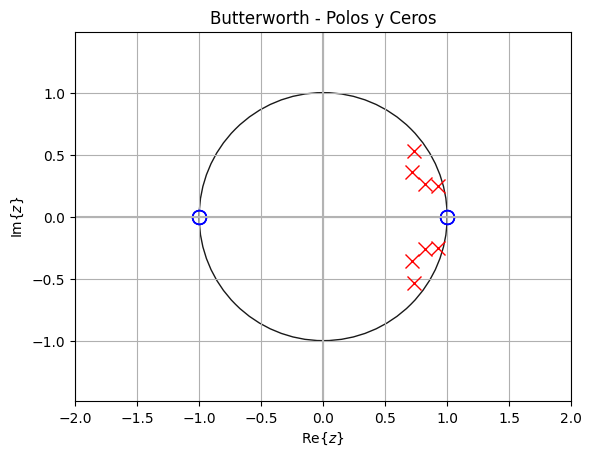

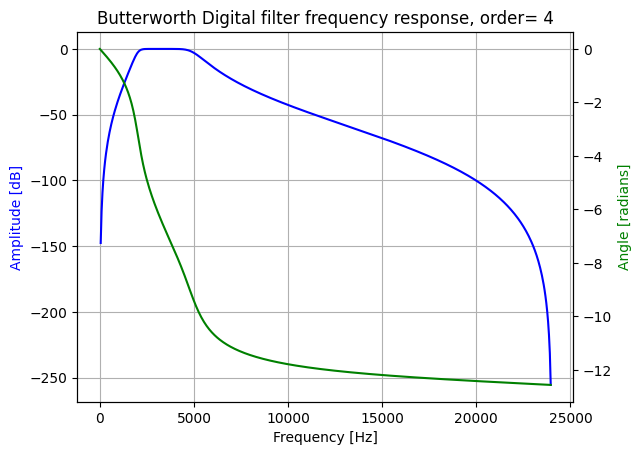

In [ ]:
# FILTRO BUTTERWORTH PASABANDA

from scipy.signal import butter as bw
from scipy.signal import freqz_zpk

# Primero diseño para ver polos y ceros (output='zpk')
N = 4  # orden del filtro Butterworth
out = 'zpk'

zeros, poles, gain = bw(N, Wn, btype=filt, output=out, fs=fs)
w, h = freqz_zpk(zeros, poles, gain, fs=fs) # respuesta en frecuencia

show_zp(zeros, poles, title='Butterworth - Polos y Ceros')
plot_freq_response('Butterworth', w, h, N)

# Ahora lo diseño en forma (b,a) para filtrar la señal de audio
b_bw, a_bw = bw(N, Wn, btype=filt, output='ba', fs=fs)

# Usamos filtfilt para no tener retardo de fase
xf_bw = filtfilt(b_bw, a_bw, xs, axis=0)

Audio([xf_bw[:,1], xf_bw[:,0]], rate=fs)  # Resultado Butterworth


/tmp/ipython-input-4251966675.py:20: RuntimeWarning: divide by zero encountered in log10
  ax1.plot(w, 20 * np.log10(abs(h)), 'b')


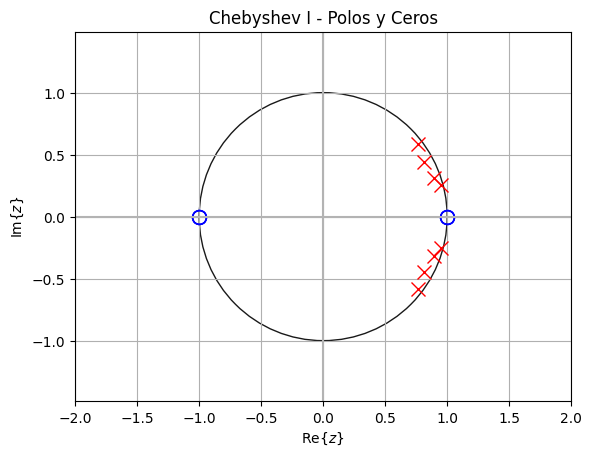

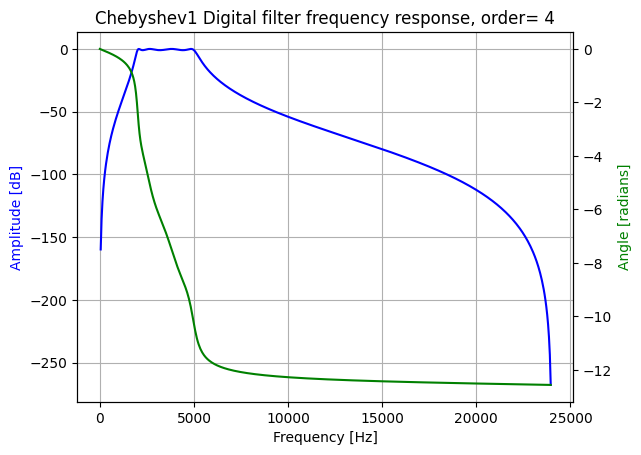

In [ ]:
# FILTRO CHEBYSHEV TIPO I (IIR)

from scipy.signal import cheby1

N = 4            # orden Chebyshev I
ripple = 1       # rizado en banda pasante en dB
out = 'zpk'

zeros_c1, poles_c1, gain_c1 = cheby1(N, rp=ripple, Wn=Wn, btype=filt, output=out, fs=fs)

w_c1, h_c1 = freqz_zpk(zeros_c1, poles_c1, gain_c1, fs=fs)

show_zp(zeros_c1, poles_c1, title='Chebyshev I - Polos y Ceros')
plot_freq_response('Chebyshev1', w_c1, h_c1, N)

# Para filtrar el audio lo diseñamos en forma (b,a)
b_c1, a_c1 = cheby1(N, rp=ripple, Wn=Wn, btype=filt, output='ba', fs=fs)
xf_c1 = filtfilt(b_c1, a_c1, xs, axis=0)
print()
Audio([xf_c1[:,1], xf_c1[:,0]], rate=fs)  # Resultado Chebyshev I

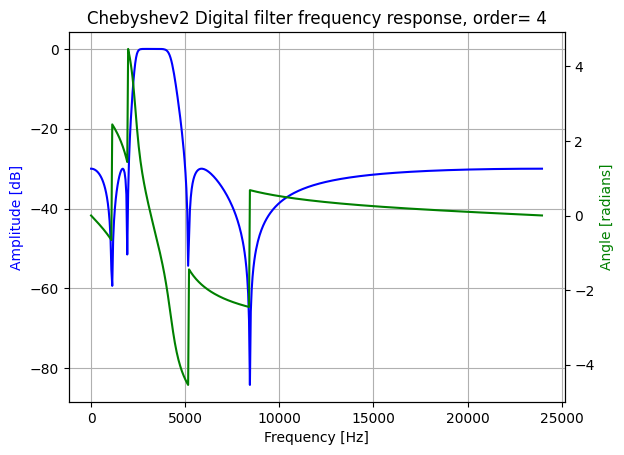

In [ ]:
# FILTRO CHEBYSHEV TIPO 2 (IIR)

from scipy.signal import cheby2
from scipy.signal import freqz

N = 4               # orden del filtro Chebyshev II
ripple_stop = 30    # atenuación mínima en banda de rechazo (dB)
out = 'ba'          # no regresa los polos y ceros, sino la función de transferencia

num_c2, den_c2 = cheby2(N, rs=ripple_stop, Wn=Wn, btype=filt, output=out, fs=fs)
w_c2, h_c2 = freqz(num_c2, den_c2, fs=fs)

plot_freq_response('Chebyshev2', w_c2, h_c2, N)

# Filtrar el audio
xf_c2 = filtfilt(num_c2, den_c2, xs, axis=0)
print()
Audio([xf_c2[:,1], xf_c2[:,0]], rate=fs)  # Resultado Chebyshev II


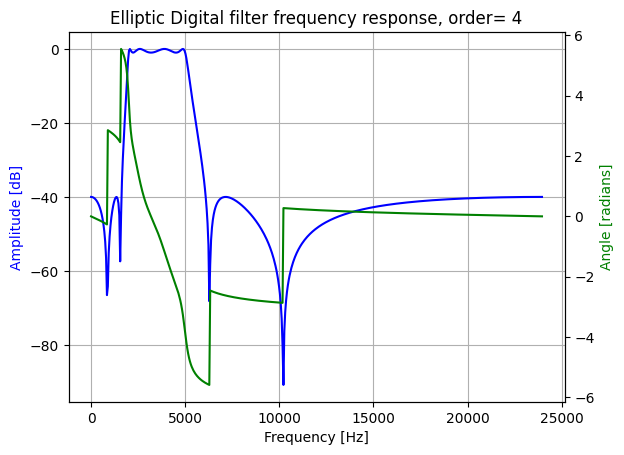

In [ ]:
# FILTRO ELÍPTICO (CAUER) IIR

from scipy.signal import ellip

N = 4              # orden elíptico
ripple_pass = 1    # rizado en banda pasante (dB)
ripple_stop = 40   # atenuación en banda de rechazo (dB)
out = 'ba'

num_el, den_el = ellip(N, rp=ripple_pass, rs=ripple_stop, Wn=Wn, btype=filt, output=out, fs=fs)
w_el, h_el = freqz(num_el, den_el, fs=fs)

plot_freq_response('Elliptic', w_el, h_el, N)

# Filtrar el audio
xf_el = filtfilt(num_el, den_el, xs, axis=0)
print()
Audio([xf_el[:,1], xf_el[:,0]], rate=fs)  # Resultado Elíptico


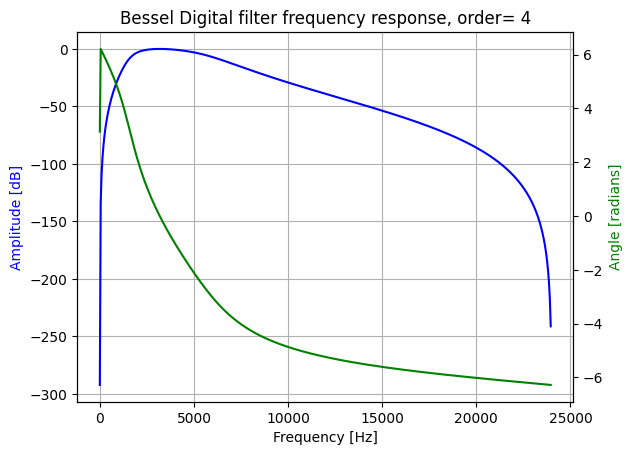

In [ ]:
# FILTRO BESSEL PASABANDA

from scipy.signal import bessel

N = 4
normalization = 'mag'  # Ajusta la frecuencia crítica según la magnitud

num_be, den_be = bessel(N, Wn=Wn, btype=filt, norm=normalization, output='ba', fs=fs)
w_be, h_be = freqz(num_be, den_be, fs=fs)

plot_freq_response('Bessel', w_be, h_be, N)

# Filtrar el audio
xf_be = filtfilt(num_be, den_be, xs, axis=0)
print()
Audio([xf_be[:,1], xf_be[:,0]], rate=fs)  # Resultado Bessel


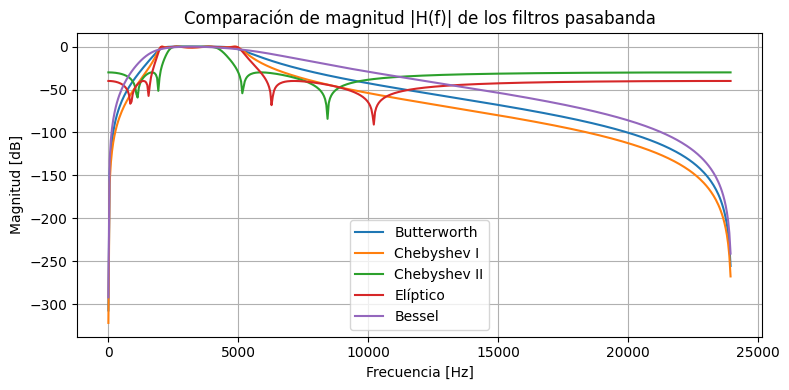

In [ ]:
from scipy.signal import freqz

# Comparar todas las respuestas en frecuencia

w,  H_bw  = freqz(b_bw,   a_bw,   fs=fs)
_,  H_c1  = freqz(b_c1,   a_c1,   fs=fs)
_,  H_c2  = freqz(num_c2, den_c2, fs=fs)
_,  H_el  = freqz(num_el, den_el, fs=fs)
_,  H_be  = freqz(num_be, den_be, fs=fs)

plt.figure(figsize=(8,4))
plt.title('Comparación de magnitud |H(f)| de los filtros pasabanda')
plt.plot(w, 20*np.log10(np.abs(H_bw)),  label='Butterworth')
plt.plot(w, 20*np.log10(np.abs(H_c1)),  label='Chebyshev I')
plt.plot(w, 20*np.log10(np.abs(H_c2)),  label='Chebyshev II')
plt.plot(w, 20*np.log10(np.abs(H_el)),  label='Elíptico')
plt.plot(w, 20*np.log10(np.abs(H_be)),  label='Bessel')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Magnitud [dB]')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


Todos los filtros dejan pasar las frecuencias que nos interesan y quitan las que están por fuera, pero cada uno lo hace de diferente manera.

Los filtros Butterworth y Bessel cambian menos el sonido, se escucha más natural.
Los Chebyshev y el Elíptico son más fuertes filtrando cortan más duro las frecuencias, pero cambian un poco más el timbre del audio.

Por eso, si quieres que suene más natural, usas Butterworth o Bessel; si quieres filtrar más agresivo, usas Chebyshev o Elíptico.

**2. Consulte en qué consiste el método de diseño de filtros FIR por ventaneo (Ver función firwin y material de apoyo). Realice un cuadro comparativo de las ventajas y desventajas de los filtros IIR y los FIR. Nota: Recuerde que un filtro FIR utiliza solamente raíces tipo ceros, es decir que  a0=1 , y  ak=0   ∀k∈{1,2,…} .**

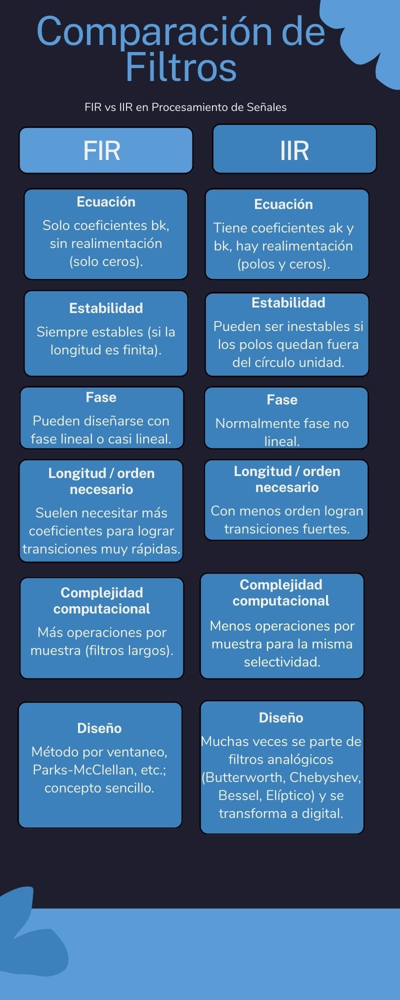

**3. Incluya la implementación del filtro firwin en el punto 1.**

FIR pasabanda con firwin:
numtaps = 201   banda pasante = [2000, 5000] Hz


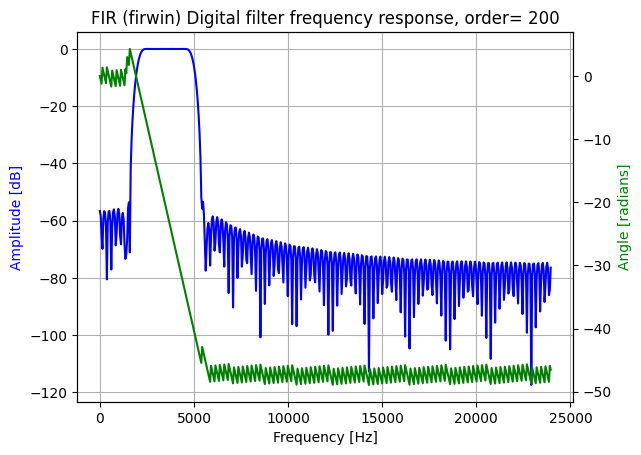

In [46]:
from scipy.signal import firwin, freqz

#PARÁMETROS DEL FIR

numtaps = 201         # número de coeficientes del FIR (más grande = transición más suave)
f1 = 2000             # corte inferior (Hz)
f2 = 5000             # corte superior (Hz)
cutoff = [f1, f2]

print("FIR pasabanda con firwin:")
print("numtaps =", numtaps, "  banda pasante =", cutoff, "Hz")

#DISEÑO DEL FILTRO FIR CON firwin

h_fir = firwin(
    numtaps,
    cutoff,
    pass_zero='bandpass',  # tipo pasabanda
    fs=fs                  # frecuencia de muestreo
)

# Respuesta en frecuencia del FIR
w_fir, H_fir = freqz(h_fir, 1, fs=fs)
plot_freq_response('FIR (firwin)', w_fir, H_fir, numtaps-1)  # orden ≈ numtaps-1

#APLICAR EL FIR AL AUDIO (xs)
xf_fir = filtfilt(h_fir, [1.0], xs, axis=0)  # [1.0] porque el denominador es 1

Audio([xf_fir[:,1], xf_fir[:,0]], rate=fs)   # Escuchar resultado FIR


Un filtro FIR diseñado con firwin se usa cuando queremos un filtro muy estable, fácil de diseñar y con una fase casi lineal, es decir, que cambie el contenido en frecuencia pero mantenga bien el orden temporal de la señal. Por eso es muy común en audio y en señales como EEG o ECG, donde se necesita controlar qué frecuencias pasan o se atenúan sin generar efectos raros en el tiempo.